In [1]:
%%capture

!pip install transformers diffusers accelerate -U
!pip install parediffusers

In [2]:
from PIL import Image
from IPython.display import Image as IPythonImage
import imageio
from tqdm import tqdm
import os
import matplotlib.pyplot as plt
import torch
from diffusers.utils.export_utils import export_to_gif
from parediffusers import PareDiffusionPipeline

# Prepare for saving as .gif
def make_gif_with_index(images, file_path, figsize=(1.28, 1.30)):
	for i, image in enumerate(images):
		fig, ax = plt.subplots(figsize=figsize)
		ax.imshow(image)
		ax.text(0.5, -0.2, f"Index: {i}", transform=ax.transAxes, ha="center")
		ax.axis('off')
		plt.subplots_adjust(bottom=0.2)
		plt.savefig(f"temp_{i}.png")
		plt.close(fig)

	# Read temporary images and append to the list
	images_with_index = []
	for i in range(len(images)):
		images_with_index.append(Image.open(f"temp_{i}.png"))

	# Save as .gif
	export_to_gif(images_with_index, file_path, fps=10)

	# Remove temporary image files
	for i in range(len(images)):
		os.remove(f"temp_{i}.png")

In [3]:
pipe = PareDiffusionPipeline.from_pretrained(
	"stabilityai/stable-diffusion-2",
	device=torch.device("cuda"),
	dtype=torch.float16,
)

prompt = "painting depicting the sea, sunrise, ship, artstation, 4k, concept art"
width = 512
height = 512
num_inference_steps = 50
guidance_scale = 7.5
torch.manual_seed(3511)

prompt_embeds = pipe.encode_prompt(prompt)
latents = pipe.get_latent(width, height).unsqueeze(dim=0)
latents = pipe.denoise(
	latents, prompt_embeds, num_inference_steps, guidance_scale
)

/usr/local/lib/python3.9/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


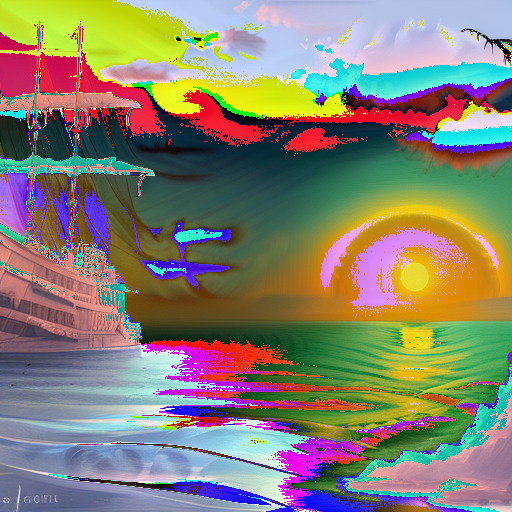

In [4]:
image = pipe.vae.decode(latents / pipe.vae.config.scaling_factor)[0]
display(pipe.tensor_to_image(image))

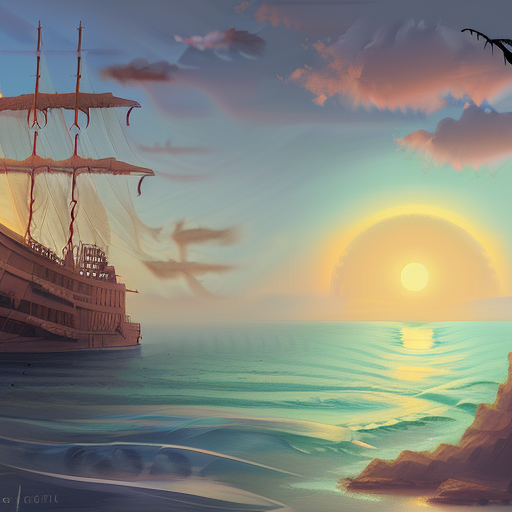

In [5]:
image = pipe.denormalize(image)
display(pipe.tensor_to_image(image))

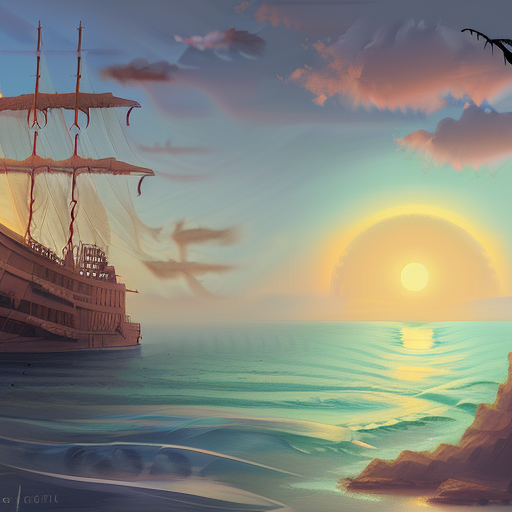

In [65]:
from parediffusers import PareAutoencoderKL
from parediffusers.models import PareDecoder
from typing import Optional

samples = []
def forward(
	sample: torch.FloatTensor,
	latent_embeds: Optional[torch.FloatTensor] = None,
) -> torch.FloatTensor:
	r"""The forward method of the `Decoder` class."""

	sample = pipe.vae.decoder.conv_in(sample)
	samples.append(sample)

	# middle
	sample = pipe.vae.decoder.mid_block(sample, latent_embeds)
	samples.append(sample)

	# up
	for up_block in pipe.vae.decoder.up_blocks:
		sample = up_block(sample, latent_embeds)
		samples.append(sample)

	# post-process
	if latent_embeds is None:
		sample = pipe.vae.decoder.conv_norm_out(sample)
	else:
		sample = pipe.vae.decoder.conv_norm_out(sample, latent_embeds)
	sample = pipe.vae.decoder.conv_act(sample)
	sample = pipe.vae.decoder.conv_out(sample)

	return sample

pipe.vae.decoder.forward = forward

torch.manual_seed(3511)
prompt_embeds = pipe.encode_prompt(prompt)
latents = pipe.get_latent(width, height).unsqueeze(dim=0)
latents = pipe.denoise(
	latents, prompt_embeds, num_inference_steps, guidance_scale
)

image = pipe.vae.decode(latents / pipe.vae.config.scaling_factor)[0]
image = pipe.denormalize(image)
display(pipe.tensor_to_image(image))

In [66]:
for sample in samples:
	print(sample.shape)

torch.Size([1, 512, 64, 64])
torch.Size([1, 512, 64, 64])
torch.Size([1, 512, 128, 128])
torch.Size([1, 512, 256, 256])
torch.Size([1, 256, 512, 512])
torch.Size([1, 128, 512, 512])


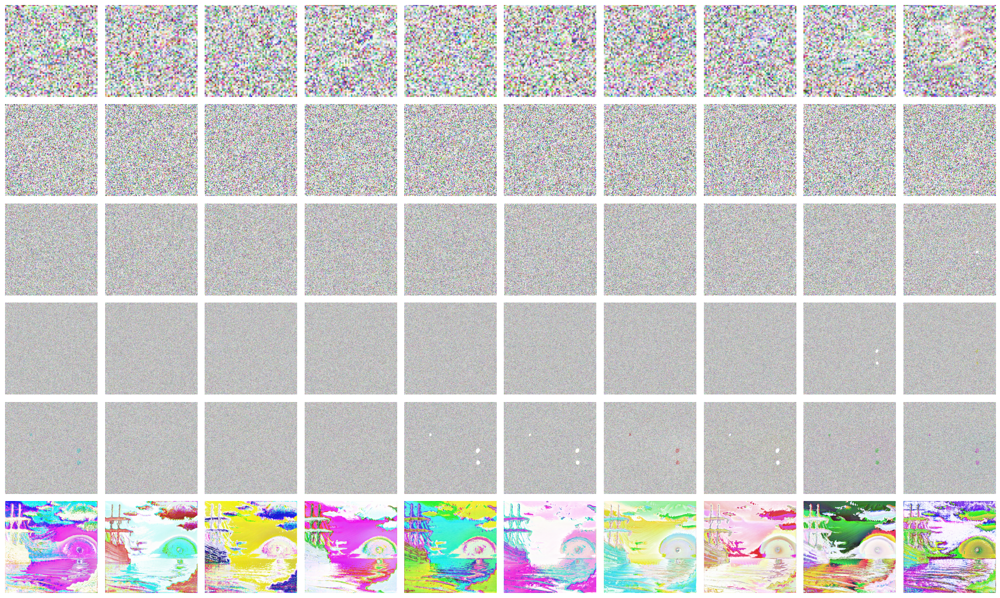

In [28]:
import matplotlib.pyplot as plt

# Assume 'samples' is a list of tensors, where each tensor can have multiple images along the first dimension
num_rows = len(samples)
num_cols = 10

fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, 2 * num_rows))

for s_i, sample in enumerate(samples):
    for i in range(num_cols):
        img = pipe.tensor_to_image(sample[0, i:i+4])  # Convert tensor to image
        axs[s_i, i].imshow(img)
        axs[s_i, i].axis('off')  # Turn off axis

plt.tight_layout()
plt.show()


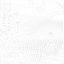

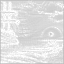

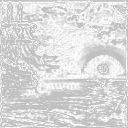

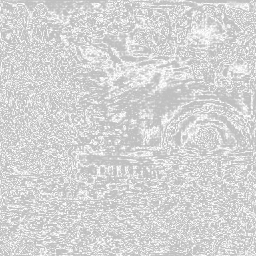

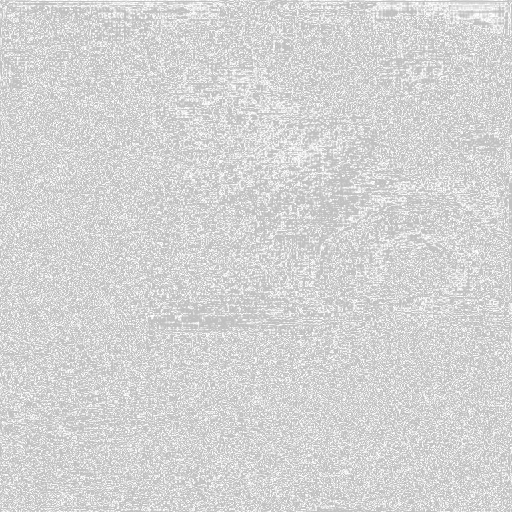

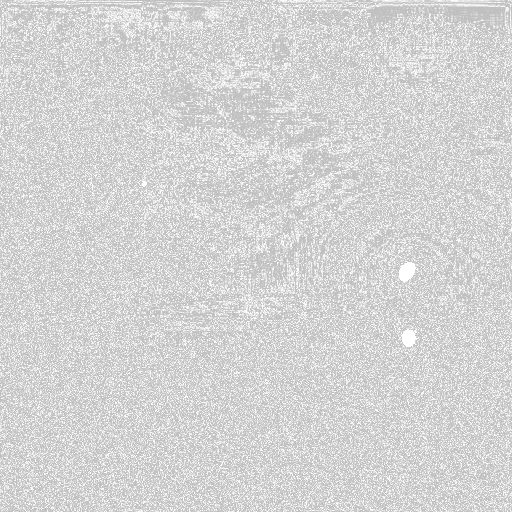

In [67]:
for s_i, sample in enumerate(samples):
	sample = sample.mean(dim=1, keepdim=True).expand(-1, 4, -1, -1)
	display(pipe.tensor_to_image(sample[0]))

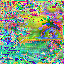

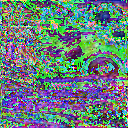

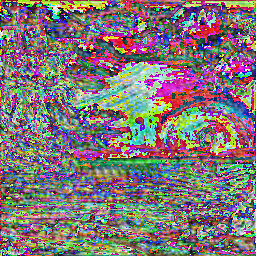

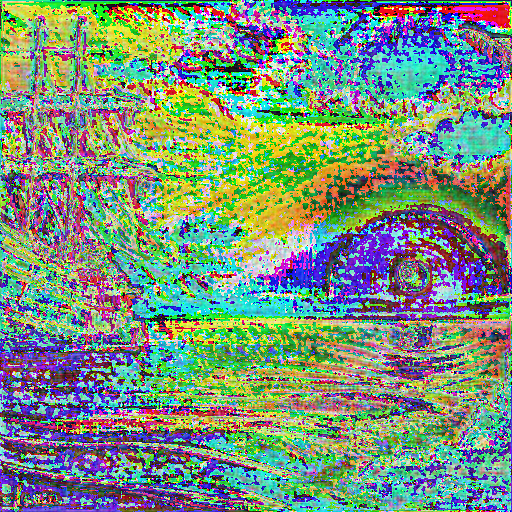

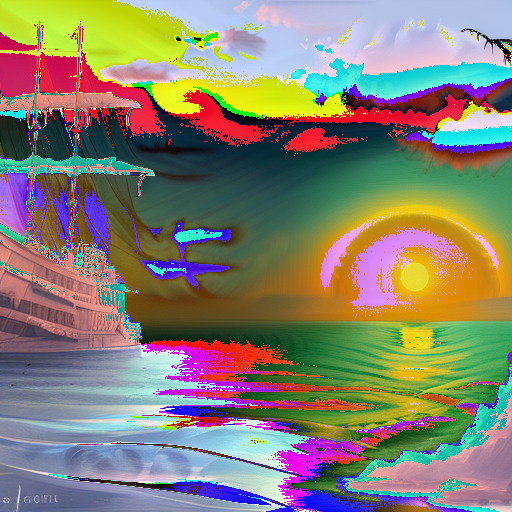

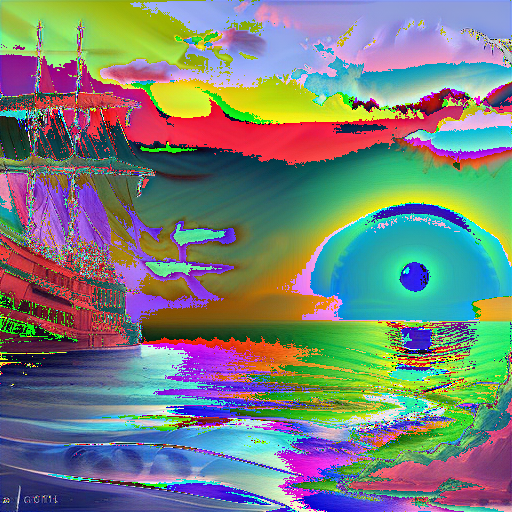

In [64]:
import matplotlib.pyplot as plt

def post_process(sample):
	sample = pipe.vae.decoder.conv_norm_out(sample)
	sample = pipe.vae.decoder.conv_act(sample)
	sample = pipe.vae.decoder.conv_out(sample)
	return sample

# Assume 'samples' is a list of tensors, where each tensor can have multiple images along the first dimension
num_rows = len(samples)
num_cols = 10

for s_i, sample in enumerate(samples):
	post_sample = post_process(sample[:, :128])
	display(pipe.tensor_to_image(post_sample[0]))